In [58]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pyarrow.parquet as pq
import plotly.graph_objects as go
import plotly.express as px
import plotly
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
# import time module
import time
plotly.offline.init_notebook_mode (connected = True)
plotly.io.templates.default = "seaborn"
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [29]:
#First import data using pyarrow
# We will start looking into batches first
start = time.time()
train_meta = pq.ParquetDataset("/kaggle/input/icecube-neutrinos-in-deep-ice/train_meta.parquet", 
                               use_legacy_dataset=False,
                               filters = [[('batch_id', "=", 1)]]
                              ).read().to_pandas()
end = time.time()
print("The time of execution of above program is :",
      (end-start) * 10**3, "ms")

The time of execution of above program is : 5232.954263687134 ms


In [30]:
train_meta.iloc[61:111]

,batch_id,event_id,first_pulse_index,last_pulse_index,azimuth,zenith
61,1,1093,4811,4915,1.367517,0.506801
62,1,1095,4916,4952,1.686937,0.648318
63,1,1112,4953,5027,1.839997,2.055360
64,1,1129,5028,5142,5.047254,2.017070
65,1,1132,5143,5191,1.933372,1.258375
66,1,1145,5192,5235,5.843186,1.894068
67,1,1150,5236,5287,4.585146,1.741281
68,1,1202,5288,7950,3.462370,1.960583
69,1,1213,7951,8168,0.336391,2.108384
70,1,1221,8169,8212,1.981126,1.564530


In [31]:
train_meta.head()

,batch_id,event_id,first_pulse_index,last_pulse_index,azimuth,zenith
0,1,24,0,60,5.029555,2.087498
1,1,41,61,111,0.417742,1.549686
2,1,59,112,147,1.160466,2.401942
3,1,67,148,289,5.845952,0.759054
4,1,72,290,351,0.653719,0.939117


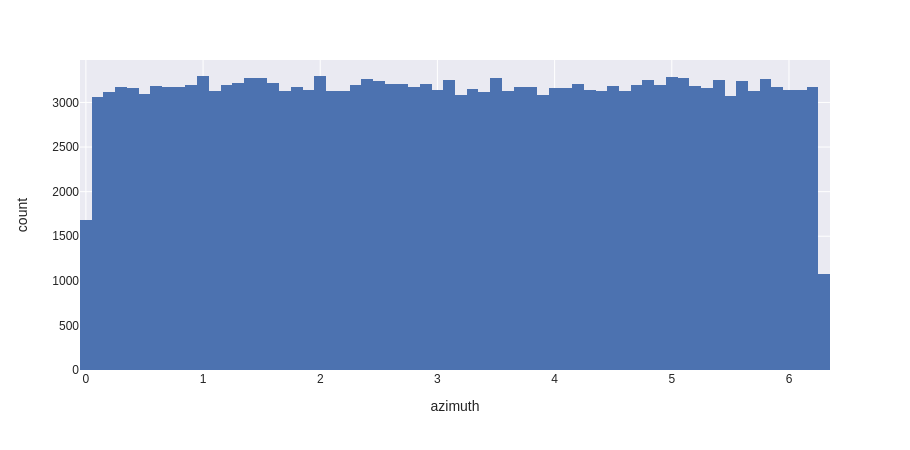

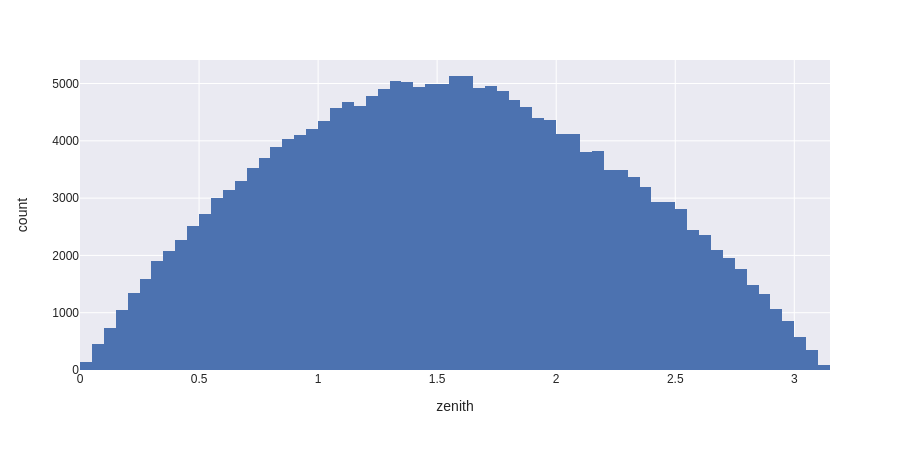

In [43]:
fig = px.histogram(train_meta, x="azimuth",nbins=100)
fig.show()
fig1 = px.histogram(train_meta, x="zenith",nbins=100)
fig1.show()


In [51]:
start = time.time()
train_batch_1 = pq.ParquetDataset("/kaggle/input/icecube-neutrinos-in-deep-ice/train/batch_1.parquet", 
                               use_legacy_dataset=False,
                              filters = [('event_id', "=", 24)]
                              ).read().to_pandas()
end = time.time()
print("The time of execution of above program is :",
      (end-start) * 10**3, "ms")

The time of execution of above program is : 969.0241813659668 ms


In [52]:
train_batch_1.head(-20)


,sensor_id,time,charge,auxiliary
event_id,,,,
24,3918,5928,1.325,True
24,4157,6115,1.175,True
24,3520,6492,0.925,True
24,5041,6665,0.225,True
24,2948,8054,1.575,True
24,860,8124,0.675,True
24,2440,8284,1.625,True
24,1743,8478,0.775,True
24,3609,8572,1.025,True


In [58]:
# Calculating the difference between two rows as the absolute has no significance but the relative time is important
#train_batch_1['time'] = train_batch_1['time'].diff()
#train_batch_1.head(-20)

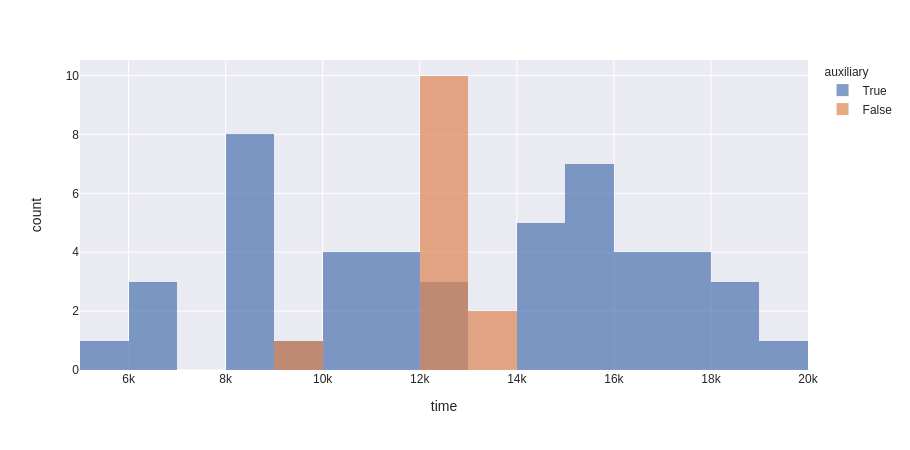

In [76]:
fig = px.histogram(train_batch_1, x="time", color="auxiliary",nbins=20)
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.7)
fig.show()

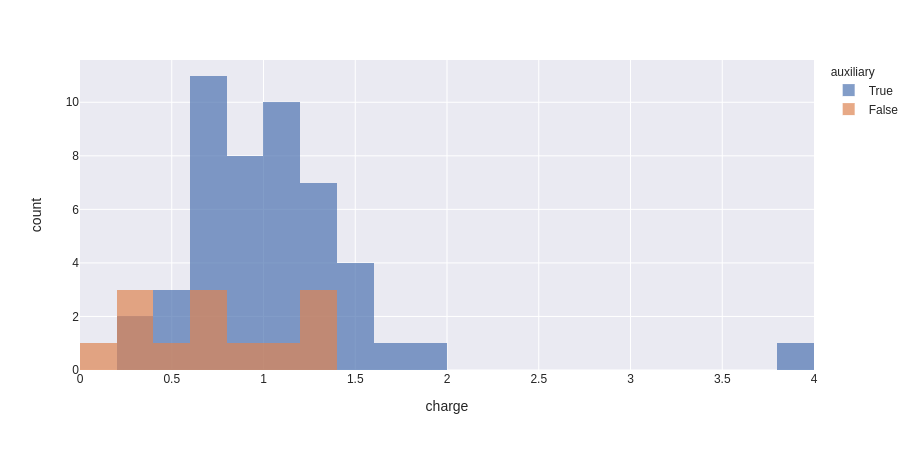

In [11]:
fig = px.histogram(train_batch_1, x="charge", color="auxiliary",nbins=20)
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.7)
fig.show()

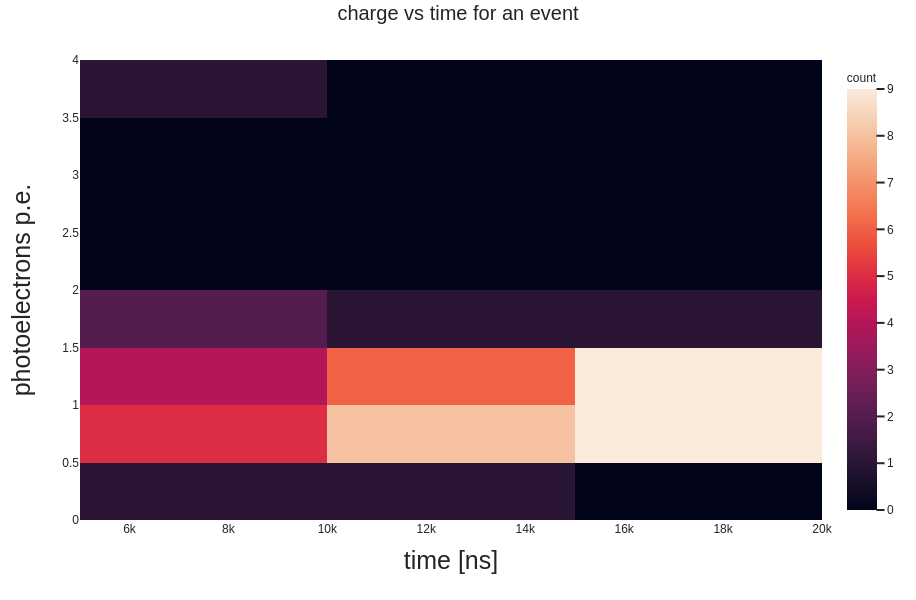

In [13]:
train_batch_1_False = train_batch_1.loc[train_batch_1.auxiliary==False]
train_batch_1_True = train_batch_1.loc[train_batch_1.auxiliary==True]
fig = px.density_heatmap(train_batch_1_True, x="time",y="charge")
fig.update_layout(height = 600, width = 1000, 
                 title = {'text' : "charge vs time for an event", 
                          'xanchor' : "center",
                          'yanchor' : 'top',
                          'font' : {'size' : 20},
                          'x' : 0.5,
                          'y' : 0.99
                         },
                  xaxis_title = r"time [ns]",
                  yaxis_title = r"photoelectrons p.e."
                 )
fig.update_xaxes(title_font_size = 25)
fig.update_yaxes(title_font_size = 25)

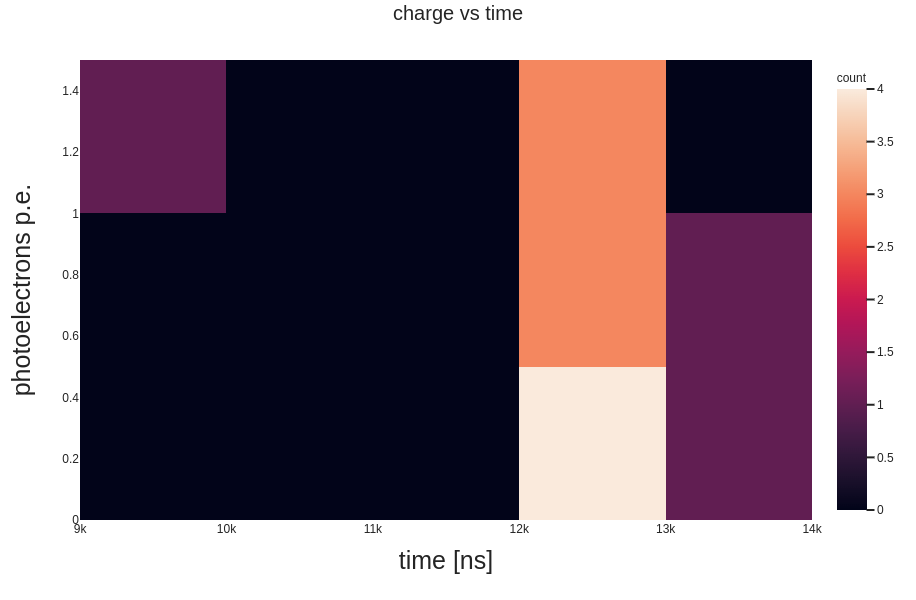

In [14]:
fig = px.density_heatmap(train_batch_1_False, x="time",y="charge")
fig.update_layout(height = 600, width = 1000, 
                 title = {'text' : "charge vs time", 
                          'xanchor' : "center",
                          'yanchor' : 'top',
                          'font' : {'size' : 20},
                          'x' : 0.5,
                          'y' : 0.99
                         },
                  xaxis_title = r"time [ns]",
                  yaxis_title = r"photoelectrons p.e."
                 )
fig.update_xaxes(title_font_size = 25)
fig.update_yaxes(title_font_size = 25)

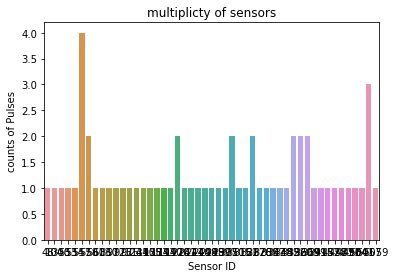

index:  557 value:  4
index:  5057 value:  3
index:  3050 value:  2
index:  3496 value:  2
index:  558 value:  2
index:  3609 value:  2
index:  3267 value:  2
index:  3520 value:  2
index:  1970 value:  2


In [77]:
#print(f"train_batch_1.shape={train_batch_1.shape}")
sensor_counts = train_batch_1['sensor_id'].value_counts()
sns.barplot(x=sensor_counts.index, y=sensor_counts.values)
plt.xlabel('Sensor ID')
plt.ylabel('counts of Pulses')
plt.title('multiplicty of sensors')
plt.show()
for i, v in sensor_counts.items():
    if v>1:
        print('index: ', i, 'value: ', v)

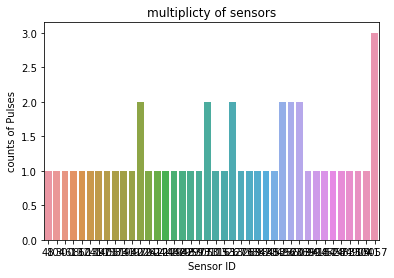

index:  5057 value:  3
index:  3496 value:  2
index:  3520 value:  2
index:  3267 value:  2
index:  3050 value:  2
index:  3609 value:  2
index:  1970 value:  2


In [78]:
sensor_counts = train_batch_1_True['sensor_id'].value_counts()
sns.barplot(x=sensor_counts.index, y=sensor_counts.values)
plt.xlabel('Sensor ID')
plt.ylabel('counts of Pulses')
plt.title('multiplicty of sensors')
plt.show()
for i, v in sensor_counts.items():
    if v>1:
        print('index: ', i, 'value: ', v)

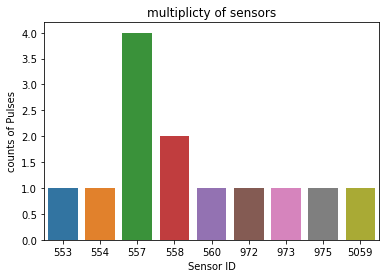

index:  557 value:  4
index:  558 value:  2


In [79]:
sensor_counts = train_batch_1_False['sensor_id'].value_counts()
sns.barplot(x=sensor_counts.index, y=sensor_counts.values)
plt.xlabel('Sensor ID')
plt.ylabel('counts of Pulses')
plt.title('multiplicty of sensors')
plt.show()
for i, v in sensor_counts.items():
    if v>1:
        print('index: ', i, 'value: ', v)